# Case Studies

## Why Look at Case Studies?
- Outline
    - LeNet-5
    - AlexNet
    - VGG
- ResNet (Residual Network)
- Inception Network

## Classic Networks
- LeNet-5
    - Advanced notes:
        - Back then, people are still using sigmoid and tanh instead ReLu for activation functions.
        - Because there wasn't enough computing power back then, instead of applying filters across all channels at the same time as what we do today, filters were applied separately to each channel.
        - It's recommended to spend more time reading Chapter II and III.
        
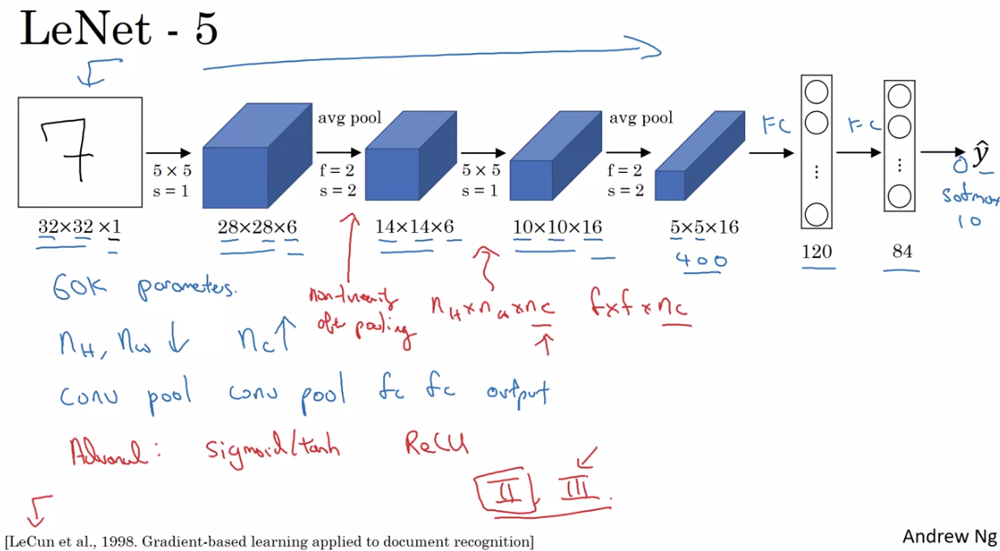

- AlexNet
    - Advanced Notes:
        - Because GPU was not as powerful back then, it uses multiple GPUs to train the NN, with part of the layers trained on each.
        - It applied **Local Response Normalization (LRN)** layers in the model.
            - This is type of layer is not used as much today.
            - It basically normalize each of the numbers on the $n_{H} \times n_{W}$ surface across the $n_{C}$ channels.

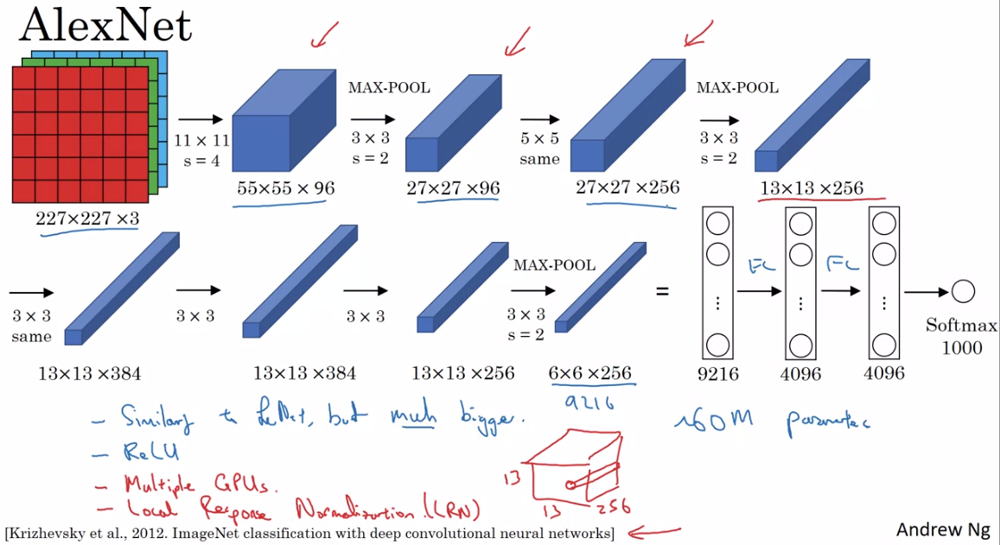

- VGG-16
    - It contains 16 layers with trainable parameters.
    - However, the architecture is very uniform in term of layers contained.
    
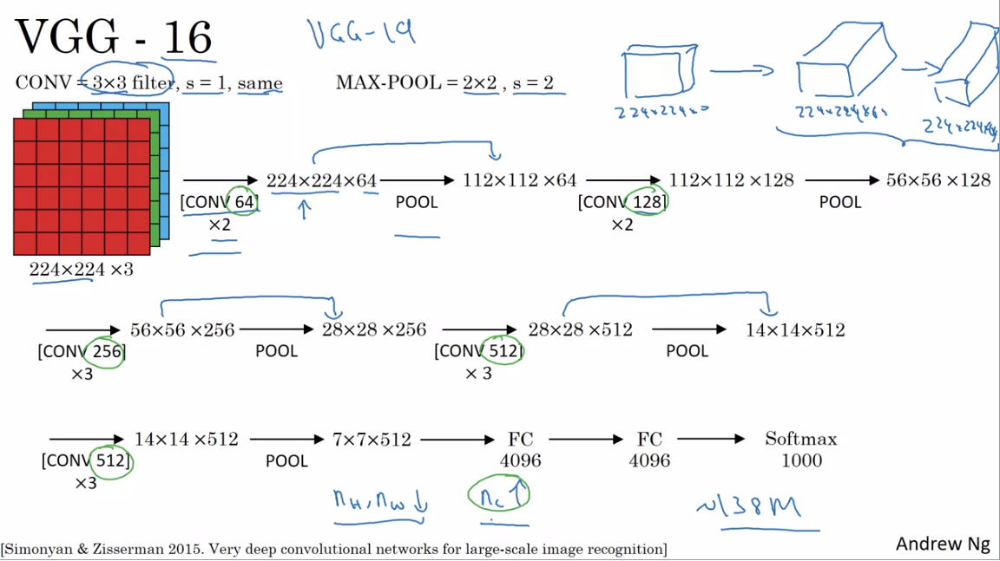

## ResNets (Residual Networks)
- Residual Block
    - In a residual block, we add a short cut path, in which we skip intermediate steps and directly feed activation $a^{[l]}$ into activation function $g$ to get $a^{[l+2]} = g(z^{[l+2]} + a^{[l]})$.

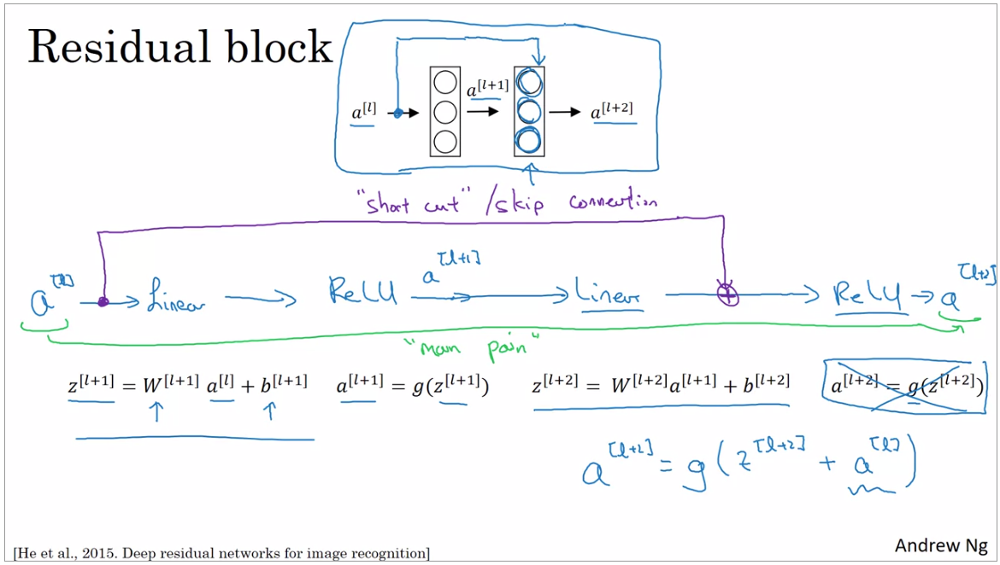

## Why Use ResNet?
- We call normal networks **plain networks** as oppose to **ResNets**.
- Theoretically, traning error should always go down as we increase the number layers in the network.
- But in reality, training error starts to increase after the plain network goes above certain depth.
- This problem could be effectively addressed using ResNets, which then allows us to train much deeper networks.

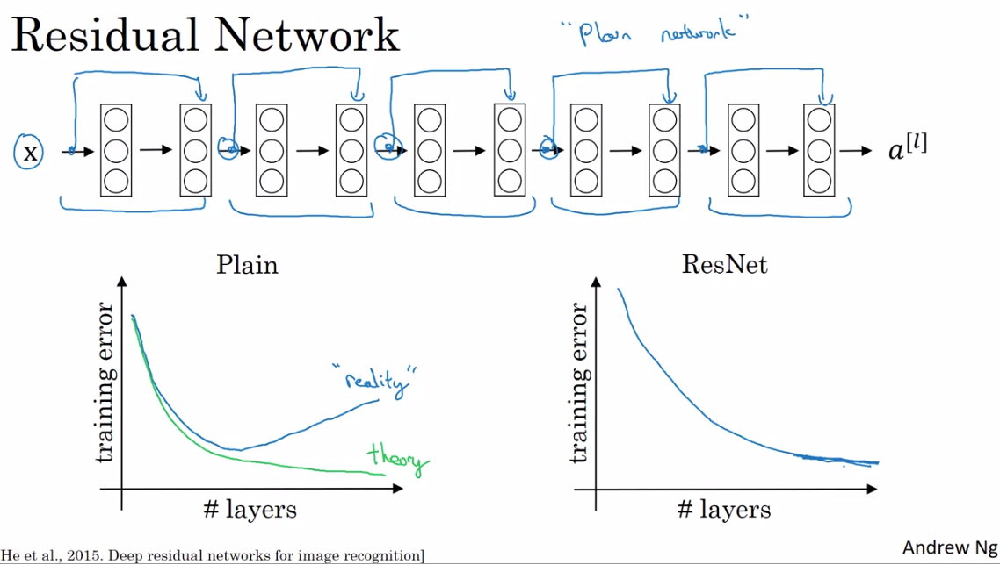

## Why Do ResNets Work?
- Recall that in a residual block, we create a short cut that feeds $a^{[l]}$ into two layers ahead such that:
    - $a^{[l+2]} = g(z^{[l+2]} + a^{[l]}) = g(W^{[l+2]} a^{[l+1]} + b^{[l+2]} + a^{[l]})$
- Think about the case when we apply regularization on parameters $W^{[l]}$ and $b^{[l]}$ such that both shrink to close to 0, then we have:
    - $a^{[l+2]} \approx g(0 + a^{[l]}) = g(a^{[l]})$
    - This means that adding the intermediate layers $l+1$ and $l+2$ is at leastly unlikely to hurt the network.
    - The model is actually more likely to get improved because it's getting deeper.
- Note that in a residual plot, we let $a^{[l+2]} = g(z^{[l+2]} + a^{[l]})$.
    - To let $z^{[l+2]}$ and $a^{[l]}$ have the same dimension, we usually apply multiple **same convolutions**.
    - In case they have different dimenions, we modify the model by adding another weight matrix:
        - $a^{[l+2]} = g(z^{[l+2]} + W_{s} a^{[l]})$
        
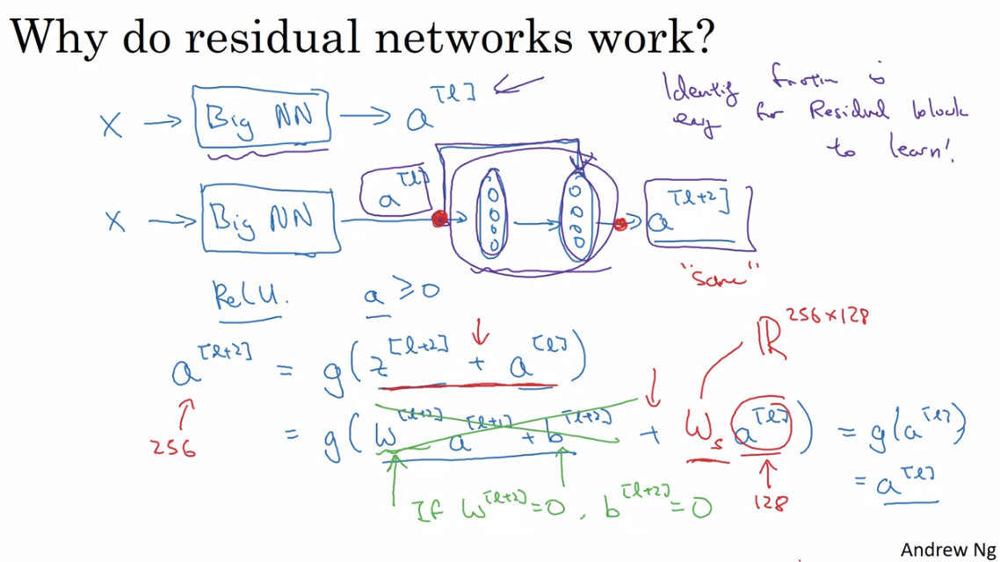

- ResNet on Images

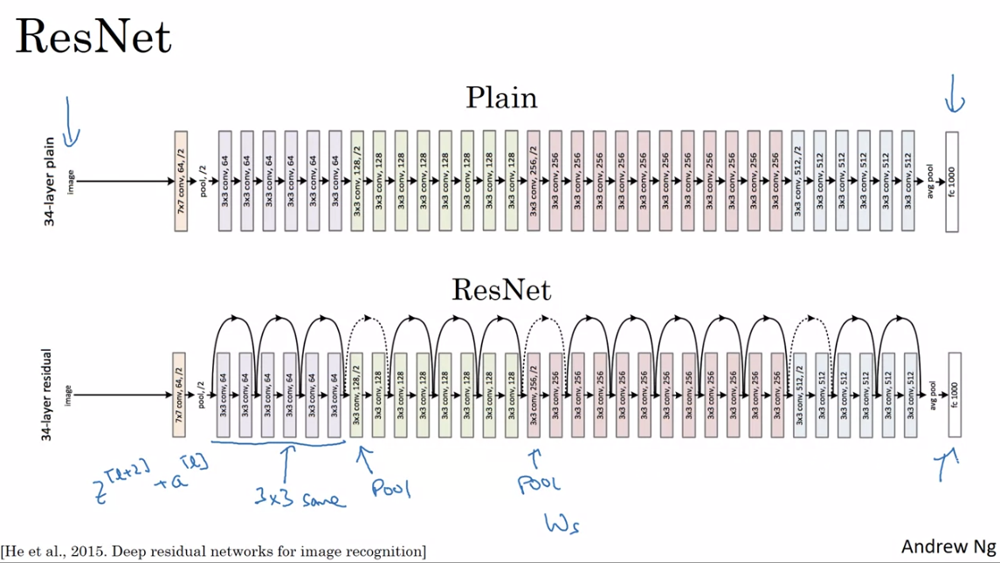

## Networks in Networks and 1x1 Convolutions
- 1x1 Convolutions is also known as networks in networks.
- Here we have multiple $1 \times 1 \times n_{C}$ filter and apply each to a "single square across channel" volume in the input, which then returns an output of shape $1 \times 1 \times \# Filters$. 

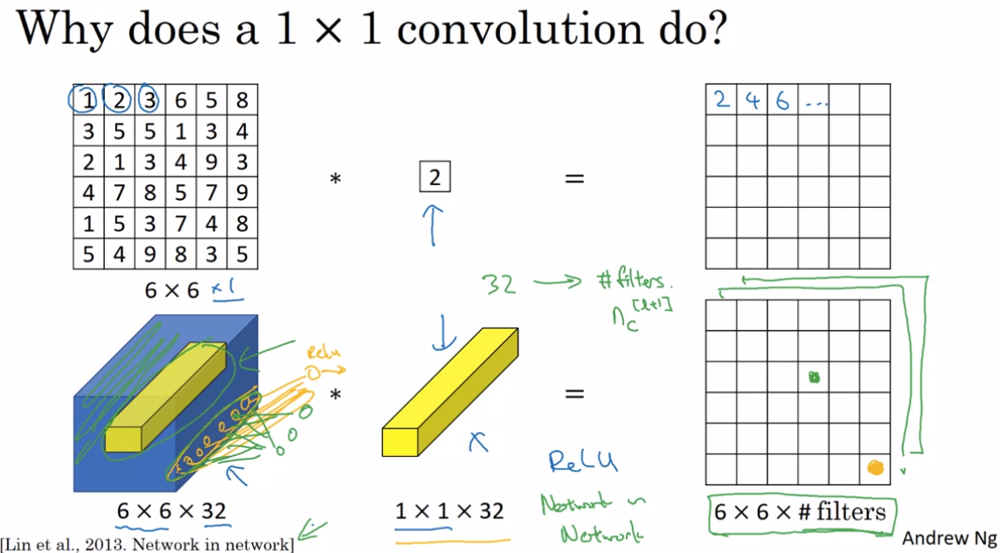

- The example below shows how 1x1 convolution can be used to shrink number channels.
    - If we want to shrink an input of shape $28 \times 28 \times 192$ into an output of shape $28 \times 28 \times 32$, we can just use 36 $1 \times 1 \times 192$ filters and apply 1x1 convolution.
    
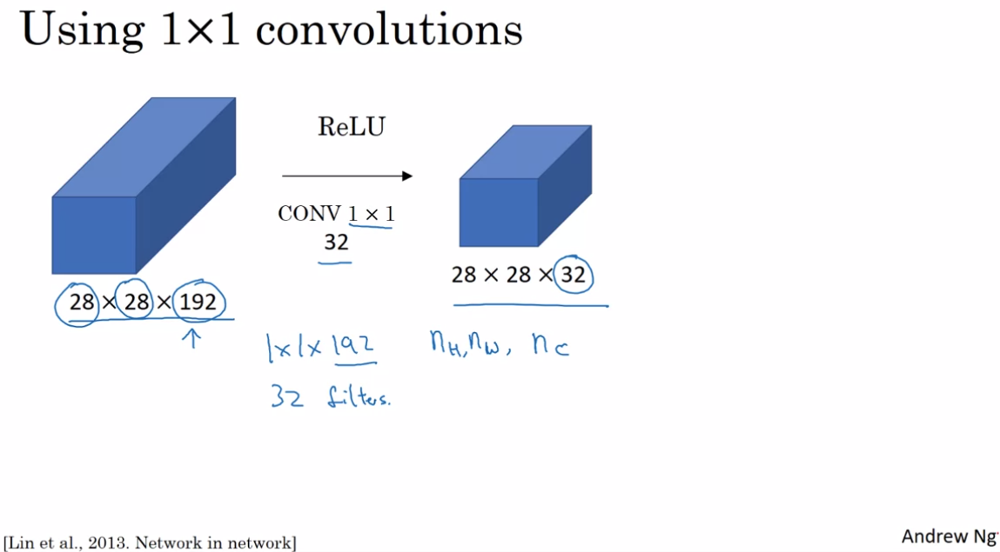

## Inception Network Motivation
- It might be hard to determine the best size of the filters to apply.
- In **inception network**, we apply multiple **same convolution/pooling** filters at the same time and stack the outputs to a deeper volume.
    - Note that we usually do not apply padding and pooling together. But here we do so to make sure the output has the same $n_{H}$ and $n_{W}$ as other same convolution layers.
    
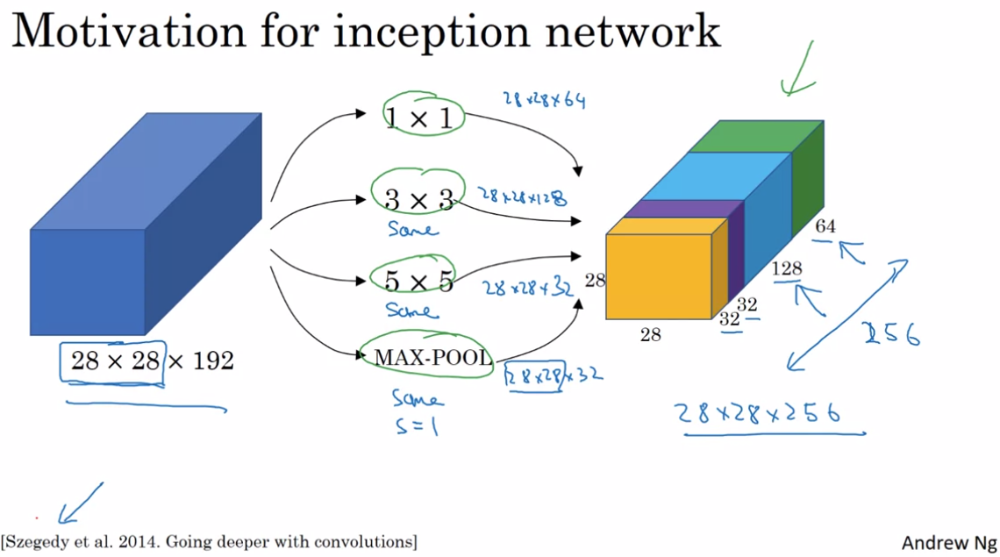

- The downside of the above architecture is that it has a high computational cost.
- However, we can use **1x1 convolution** as a work around.

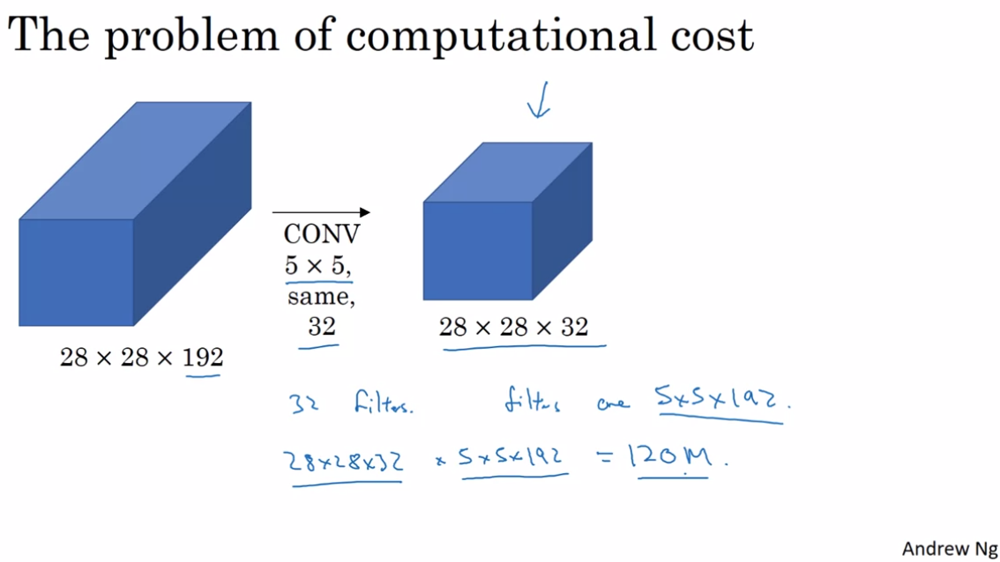

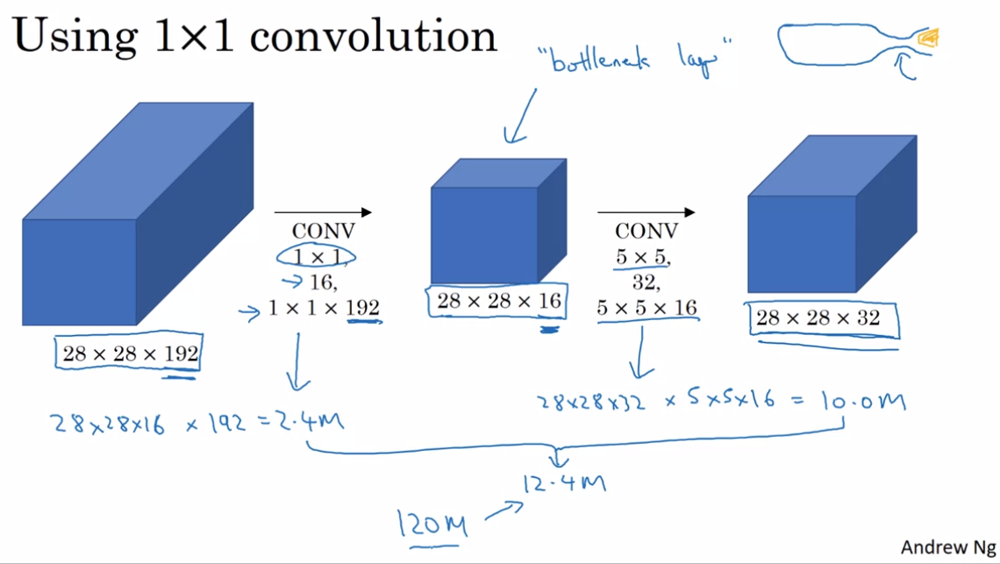

## Inception Network

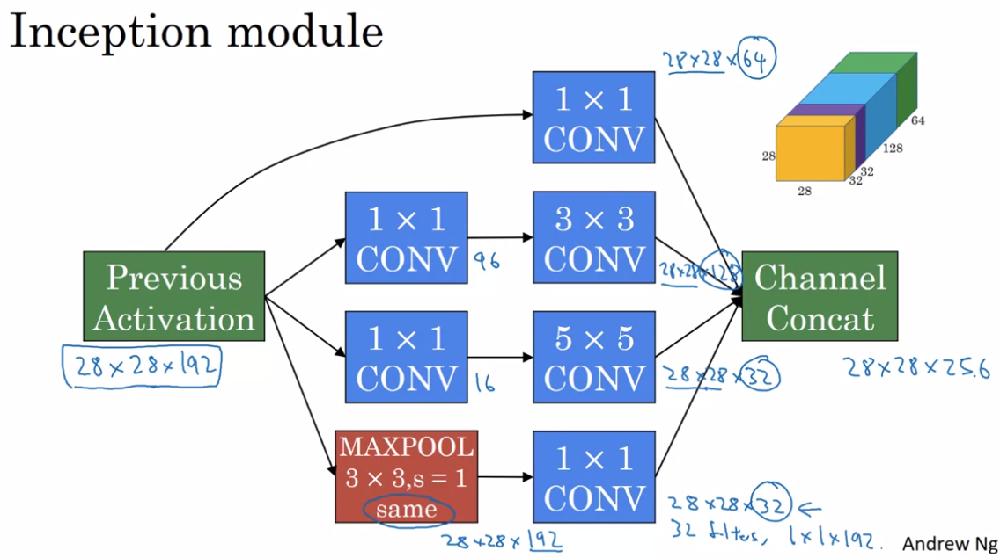

- The **inception network** is the inception module repeated for multiple times throughout the network.
    - Sometimes we add additional **side-braches** to make predictions before propagating through all layers.
    
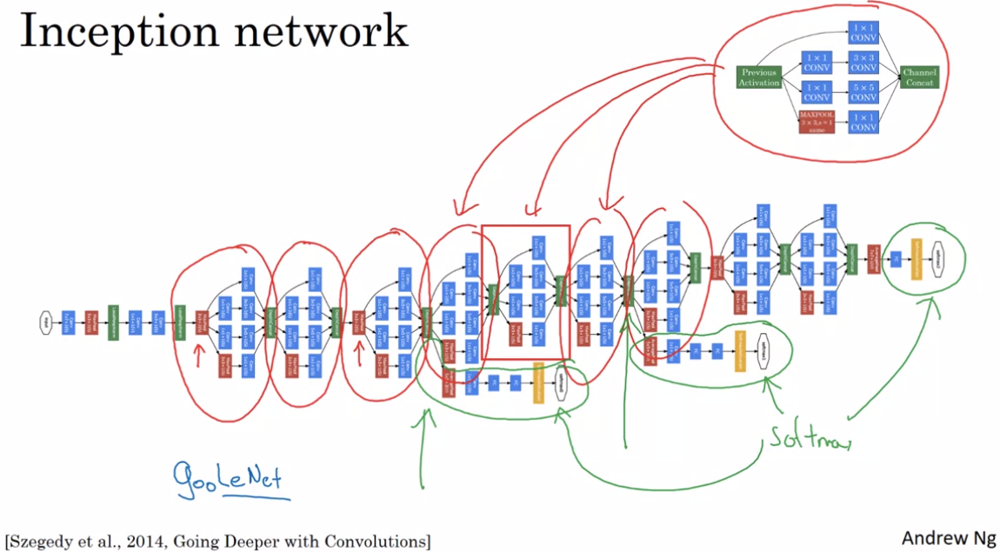

# Practical Advices for Using ConvNets

## Using Open-Source Implementations
- It is often hard and time-consuming to replicate/implement existing networks from scratch.
- Using open-source implementations (e.g. GitHub) is usually more efficient.

## Transfer Learning
- The computer vision research community has been pretty good at posting data sets, along with the weights researchers have trained using weeks even months.
- It's almost **always** a good idea to download open source implementations (both code and weights) as your initializations for your parameters and apply **transfer learning**, unless you have an exceptionally large dataset.
- If you have a relatively small dataset, Andrew recommends **freeze** all pre-trained weights and only train parameters on the new-added layers.
    - In this case, a even faster way to train is to find the function that directly maps $x$ to the output of the last frozen layer and then train a much shallower network from there.
    - The general rule-of-thumb is that the more data you have, the less layers you need to freeze and the more layers you can train on top by your own.
    
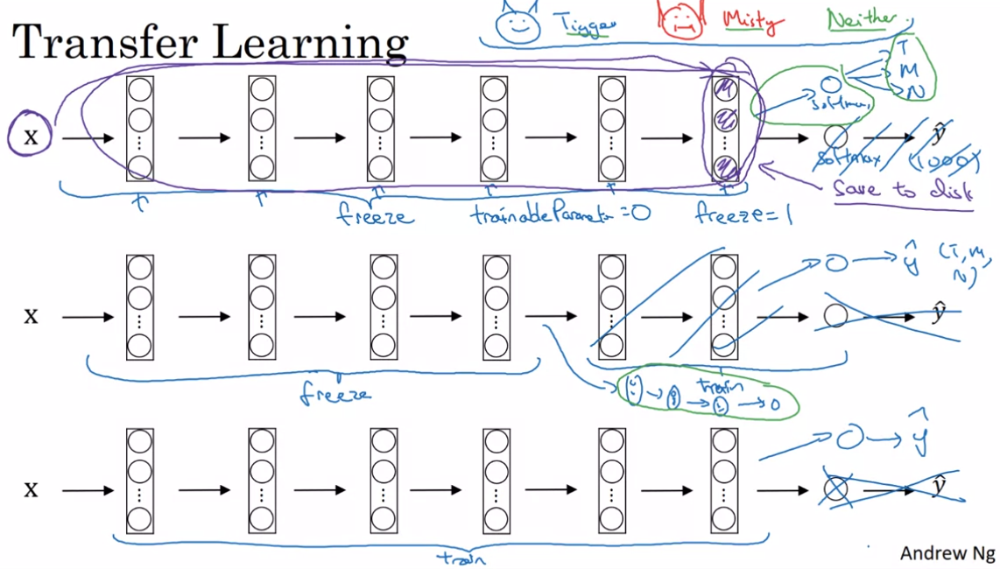

## Data Augmentation
- In the current state of computer vision research, it is always the case where we don't have enough data for the task.
- Thus, data augmentation can often help us a lot, no matter if we apply transfer learning or train our own network from scratch.
- Common Augmentation Methods
    - **Mirroring**
    - **Random Cropping**
    - Rotation
    - Shearing
    - Local warping
    - **Color Shifting**
    
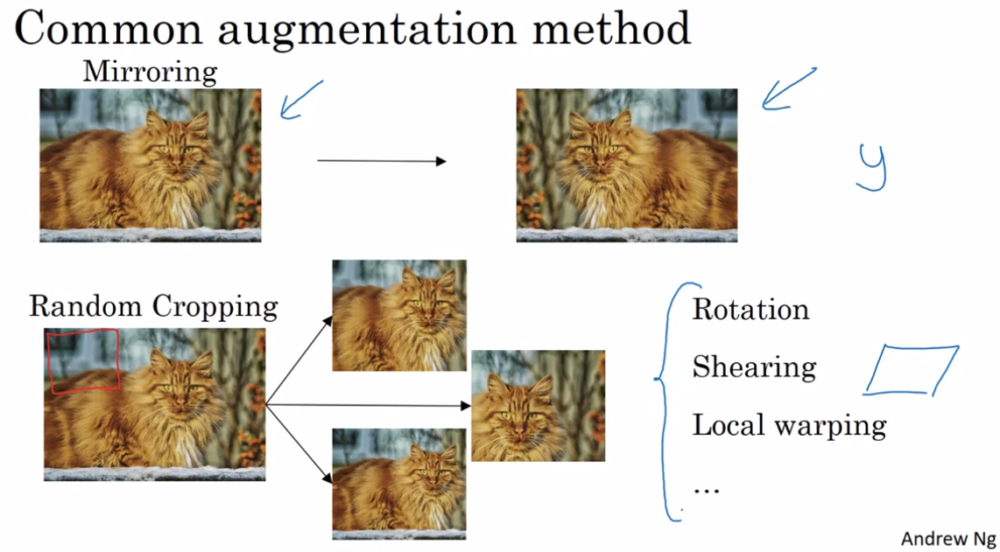

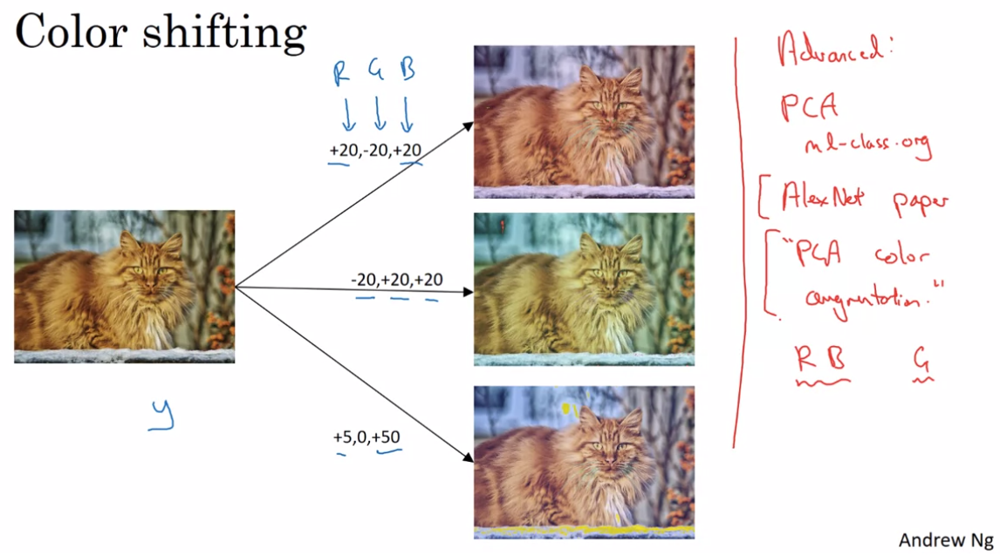

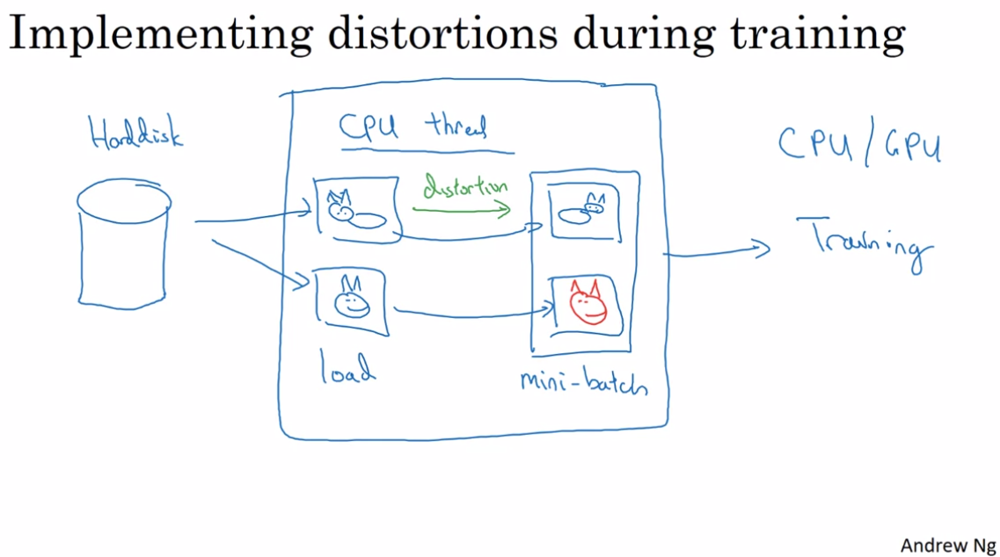

## State of Computer Vision

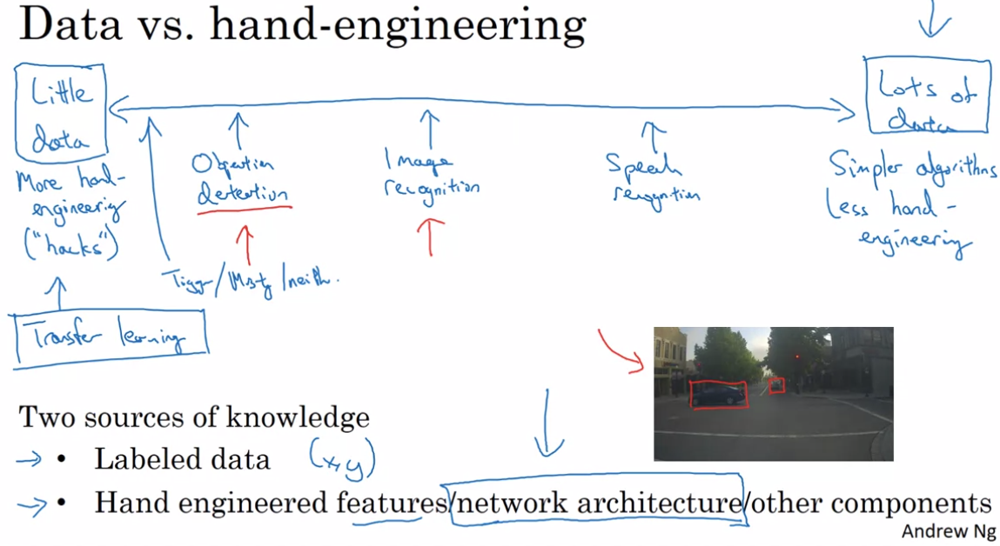

- Tips for doing well on benchmarks/winning competitions
    - **Ensembling**
        - Train several networks independently and average their outputs
        - Probably 1-2% improve in performance
        - This is usually not applied in the industry because of high computational cost.
    - **Multi-crop** at test time
        - Run classifier on multiple versions of test images and average results
    - Use **open source code**
        - Use architecture of networks published in the literature
            - Usually networks doing well in one computer vision task will do well on many others.
        - Use open source implementations if possible
        - Use pretrained models and fine-tune on your dataset
        
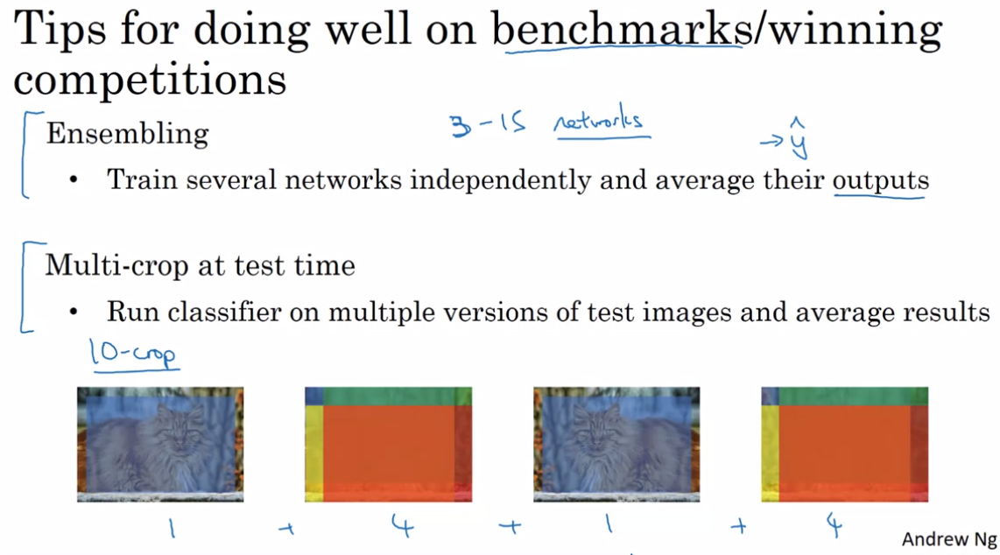